# VLM-Assisted Spike Sorting Curation and Merge Analysis Tutorial

## Introduction

Spike sorting is the process of identifying and classifying action potentials (spikes) from individual neurons in extracellular recordings. However, automated spike sorters often produce imperfect results with two main problems:

1. **False Positives**: Noisy, poorly isolated units that don't represent real neurons
2. **Oversplit Units**: Single neurons that get split into multiple units by the sorter

Traditional curation requires manual inspection of hundreds of units, which is time-consuming and subjective. This tutorial demonstrates how **Vision-Language Models (VLMs)** can automate this process by analyzing the same visual features that human experts use.

## What This Tutorial Covers

In this tutorial, we will:

1. **Generate ground truth data** and run Mountainsort4 to get initial sorting results
2. **Use VLM Curation** to automatically identify and remove false positive (noisy) units
3. **Use VLM Merge Analysis** to identify and merge oversplit units that belong to the same neuron
4. **Compare results** at each stage to see how VLM processing improves spike sorting quality

## Key Benefits of VLM-Assisted Curation

- **Automated**: Reduces manual curation time from hours to minutes
- **Consistent**: Applies the same criteria across all units
- **Interpretable**: Provides detailed reasoning for each decision
- **Effective**: Significantly reduces false positives while recovering oversplit neurons

Let's get started!

## 1. Generate Ground Truth Data and Run Spike Sorter

First, we'll generate synthetic ground truth data and run Mountainsort4 to get initial sorting results. This gives us a controlled dataset where we know the true neurons, allowing us to evaluate how well our VLM curation workflow performs.

In [ ]:
import numpy as np
from dotenv import load_dotenv
from spikeagent import (
    create_merge_img_df,
    run_vlm_merge,
    plot_merge_results,
    get_model,
    plot_units_with_features,
    create_unit_img_df,
    run_vlm_curation,
    plot_spike_images_with_result
)

Mountainsort4 use the OLD spikeextractors mapped with NewToOldRecording


sys:1: DeprecationWarning: Call to deprecated function (or staticmethod) _destroy.
sys:1: DeprecationWarning: Call to deprecated function (or staticmethod) _destroy.


NpzSortingExtractor: 88 units - 1 segments - 25.0kHz
  file_path: /mnt/Storage7/spikeagent_test/SpikeAgent/tutorials/moutainsort4_sorting/sorter_output/firings.npz

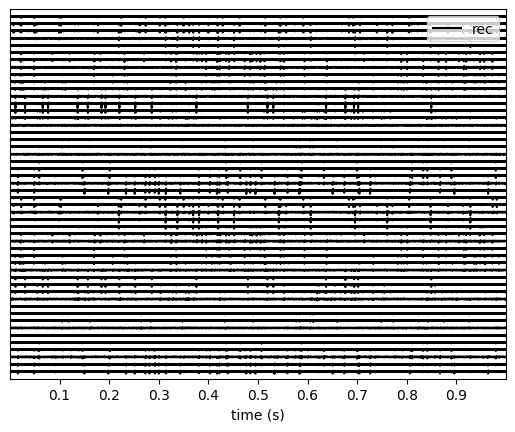

In [6]:
import spikeinterface.full as si
si.set_global_job_kwargs(n_jobs=-1)
rec0, gt_sorting0 = si.generate_ground_truth_recording(num_channels=50, durations=[30.], seed=43, num_units=30)
si.plot_traces(rec0)
rec0 = si.bandpass_filter(rec0, freq_min=300, freq_max=6000)
sorter_name = "mountainsort4"
sorting_folder = "./moutainsort4_sorting"
default_params = si.get_default_sorter_params(sorter_name)
sorting = si.run_sorter(
    sorter_name=sorter_name,
    recording=rec0,
    folder=sorting_folder,
    remove_existing_folder=True,
    **default_params
)
sorting

## 2. Initial Sorting Performance
 
Let's evaluate how well Mountainsort4 performed by comparing it to the ground truth. This comparison will establish our baseline performance before applying any curation methods. 

The agreement matrix below shows the matching between ground truth units (y-axis) and detected units (x-axis). Perfect sorting would show a diagonal pattern with high agreement scores. As we can see, there are significant mismatches - many ground truth units are either missed, oversplit into multiple detected units, or merged with other units. This demonstrates the need for effective curation methods.

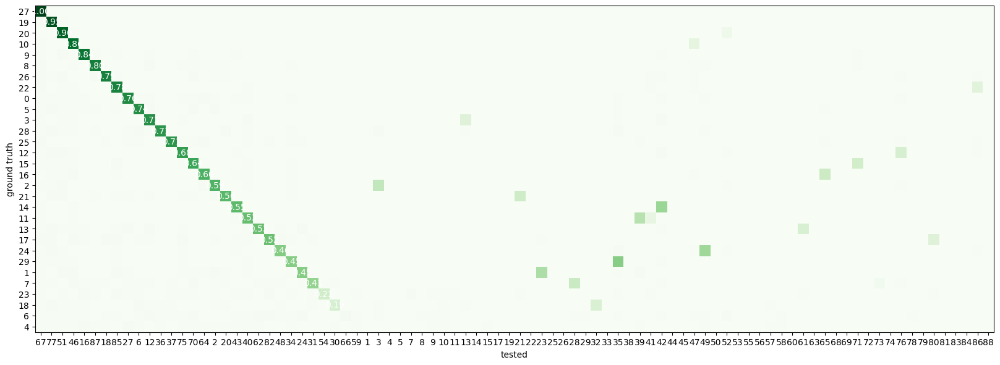

In [7]:
comp_gt = si.compare_sorter_to_ground_truth(gt_sorting=gt_sorting0, tested_sorting=sorting, exhaustive_gt=True)
si.plot_agreement_matrix(comp_gt, figsize=(20, 10))

## 3. Create SortingAnalyzer and Compute Extensions

We will create a SortingAnalyzer for analyzing sorting results. We need to compute various extensions (waveforms, quality metrics, etc.) that will provide the data for VLM analysis.

In [8]:
analyzer_folder = sorting_folder + "/sorting_analyzer.zarr"
sorting_analyzer = si.create_sorting_analyzer(
    sorting=sorting,
    recording=rec0,
    format='zarr',
    folder=analyzer_folder,
    overwrite=True
)

estimate_sparsity (workers: 30 processes):   0%|          | 0/30 [00:00<?, ?it/s]

In [9]:
extension_params = {
    "random_spikes": {"method": "uniform", "max_spikes_per_unit": 600},
    "waveforms": {"ms_before": 1.0, "ms_after": 2.0},
    "templates": {},
    "template_similarity": {},
    "spike_locations": {},
    "unit_locations": {},
    "isi_histograms": {"window_ms": 30, "bin_ms": 0.5, "method": "auto"},
    "correlograms": {"window_ms": 30, "bin_ms": 0.5, "method": "auto"},
    "spike_amplitudes": {},
    "noise_levels": {},
    "principal_components": {},
    "quality_metrics": {
        "metric_names": [
            "snr", "firing_rate", "isi_violation",
            "presence_ratio", "amplitude_cutoff", "amplitude_median", 'l_ratio', 'nearest_neighbor',
        ]
    }
}

for key, value in extension_params.items():
    print(f"Computing {key}...")
    extension = sorting_analyzer.get_extension(key)
    if extension is None or not value.items() <= extension.params.items():
        sorting_analyzer.compute(key, **value)
    else:
        print(f"{key} already computed with compatible parameters")

print("All extensions computed successfully.")
print("\n--- SortingAnalyzer after extension computation ---")
print(sorting_analyzer)

Computing random_spikes...
Computing waveforms...


compute_waveforms (workers: 30 processes):   0%|          | 0/30 [00:00<?, ?it/s]

Computing templates...
Computing template_similarity...
Computing spike_locations...


spike_locations (workers: 30 processes):   0%|          | 0/30 [00:00<?, ?it/s]

Computing unit_locations...
Computing isi_histograms...
Computing correlograms...
Computing spike_amplitudes...


spike_amplitudes (workers: 30 processes):   0%|          | 0/30 [00:00<?, ?it/s]

Computing noise_levels...


noise_level (workers: 20 processes):   0%|          | 0/20 [00:00<?, ?it/s]

Computing principal_components...


Fitting PCA:   0%|          | 0/88 [00:00<?, ?it/s]

Projecting waveforms:   0%|          | 0/88 [00:00<?, ?it/s]

Computing quality_metrics...


/home/arnau/miniconda3/envs/spikeagent_test/lib/python3.11/site-packages/spikeinterface/qualitymetrics/misc_metrics.py:311: UserWarning: Bin duration of 60s is larger than recording duration. Presence ratios are set to NaN.
  warnings.warn(
/home/arnau/miniconda3/envs/spikeagent_test/lib/python3.11/site-packages/spikeinterface/qualitymetrics/misc_metrics.py:1059: UserWarning: Some units have too few spikes : amplitude_cutoff is set to NaN
  warnings.warn(f"Some units have too few spikes : amplitude_cutoff is set to NaN")


calculate_pc_metrics:   0%|          | 0/88 [00:00<?, ?it/s]

/home/arnau/miniconda3/envs/spikeagent_test/lib/python3.11/site-packages/sklearn/utils/parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
/home/arnau/miniconda3/envs/spikeagent_test/lib/python3.11/site-packages/sklearn/utils/parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
/home/arnau/miniconda3/envs/spikeagent_test/lib/python3.11/site-packages/sklearn/utils/parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
/home/arna

All extensions computed successfully.

--- SortingAnalyzer after extension computation ---
SortingAnalyzer: 50 channels - 88 units - 1 segments - zarr - sparse - has recording
Loaded 12 extensions: random_spikes, waveforms, templates, template_similarity, spike_locations, unit_locations, isi_histograms, correlograms, spike_amplitudes, noise_levels, principal_components, quality_metrics


## 4. VLM Curation: Removing False Positive Units

### 4.1 Visualize Unit Features

Let's first look at what the units look like. We'll plot various features that help assess unit quality: waveforms, autocorrelograms, spike locations, and amplitude distributions.

/mnt/Storage7/spikeagent_test/SpikeAgent/src/spikeagent/app/tool/si_custom/custom_plot.py:218: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)


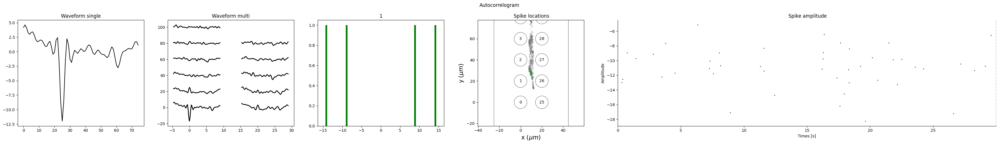

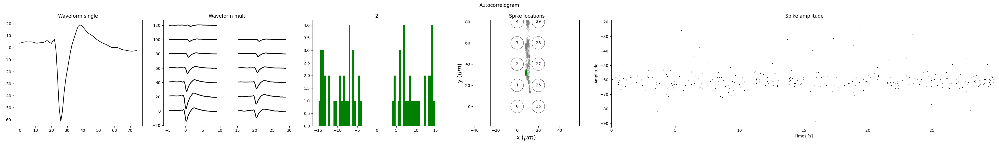

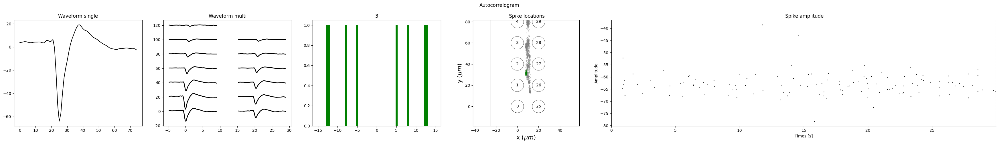

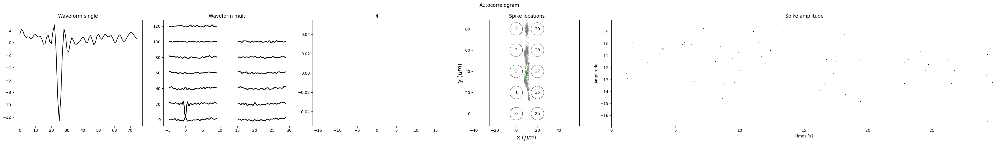

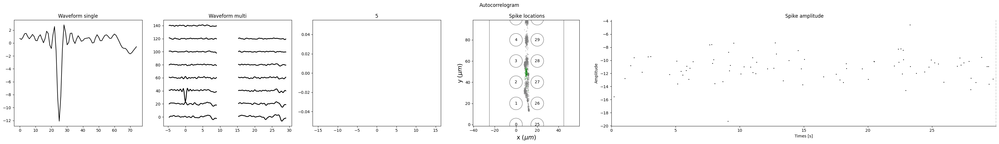

...

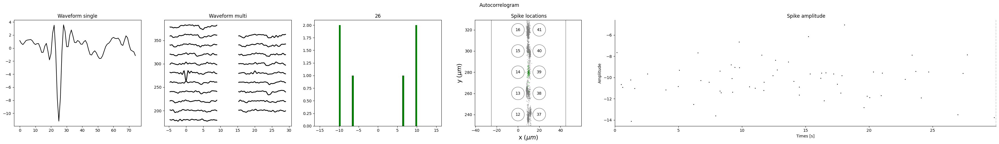

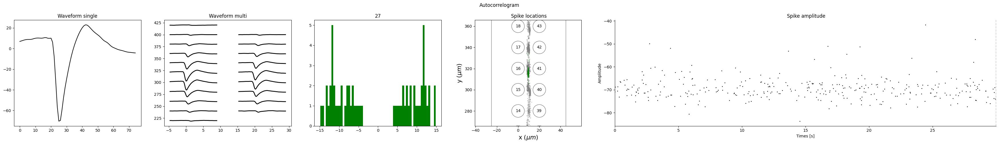

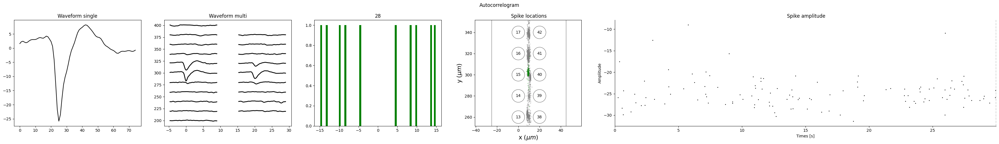

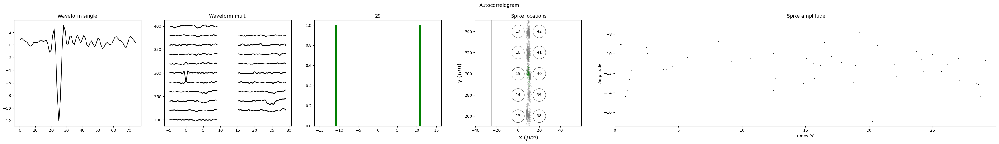

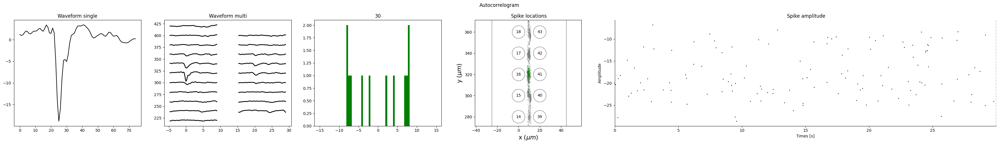

In [13]:
analyzer_to_use = sorting_analyzer
features_to_plot = ['waveform_single', 'waveform_multi', 'autocorr', 'spike_locations', 'amplitude_plot']
plot_units_with_features(
    analyzer_to_use,
    unit_ids=analyzer_to_use.unit_ids[:30],
    features=features_to_plot,
    save=False,
)

### 4.2 Prepare Images for VLM Analysis

The VLM works by analyzing images of unit features. We create a DataFrame containing base64-encoded images of each unit's features.

In [12]:
unit_img_df = create_unit_img_df(
    sorting_analyzer,
    unit_ids=None,
    load_if_exists=False,
    save_folder=sorting_folder
)

Encoding 88 unit images..


  0%|          | 0/88 [00:00<?, ?it/s]

100%|██████████| 88/88 [03:08<00:00,  2.14s/it]


Unit images saved to moutainsort4_sorting/unit_img.csv


### 4.3 Run VLM Curation

Now we use VLM curation module of SpikeAgent to classify each unit as "Good" or "Bad". The VLM analyzes the visual features and quality metrics to make informed decisions. We provide examples of good and bad units to guide the model.

In [14]:
model = get_model(model_name='gpt-4o')
results_df = run_vlm_curation(
    model=model,
    sorting_analyzer=sorting_analyzer,
    img_df=unit_img_df,
    features=["waveform_single", "waveform_multi", "autocorr", "spike_locations", "amplitude_plot"],
    good_ids=[2,6],
    bad_ids=[9,10],
    with_metrics=True,
    metrics_list=["snr","isi_violations_ratio","nn_hit_rate", "l_ratio"]
    )

Processing Units:  92%|█████████▏| 81/88 [16:59<01:26, 12.42s/unit]❌ Error processing unit, attempt 1: <html>
<head><title>504 Gateway Time-out</title></head>
<body>
<center><h1>504 Gateway Time-out</h1></center>
</body>
</html>
Processing Units:  95%|█████████▌| 84/88 [17:54<00:53, 13.42s/unit]❌ Error processing unit, attempt 1: <html>
<head><title>504 Gateway Time-out</title></head>
<body>
<center><h1>504 Gateway Time-out</h1></center>
</body>
</html>
Processing Units: 100%|██████████| 88/88 [19:18<00:00, 13.16s/unit]


In [15]:
unit_classes = results_df.groupby('final_classification').groups
good_units = unit_classes.get('Good', []).tolist()
bad_units = unit_classes.get('Bad', []).tolist()
print('Final VLM Classification Results:')
print(f"Good units: {good_units}\\nBad units: {bad_units}")

Final VLM Classification Results:
Good units: [2, 3, 6, 12, 13, 16, 18, 20, 21, 23, 24, 27, 28, 31, 34, 35, 36, 37, 39, 40, 41, 42, 43, 46, 48, 49, 51, 61, 62, 64, 65, 67, 70, 71, 75, 76, 77, 82, 85, 87]\nBad units: [1, 4, 5, 7, 8, 9, 10, 11, 14, 15, 17, 19, 22, 25, 26, 29, 30, 32, 33, 38, 44, 45, 47, 50, 52, 53, 54, 55, 56, 57, 58, 59, 60, 63, 66, 68, 69, 72, 73, 74, 78, 79, 80, 81, 83, 84, 86, 88]


### 4.4 Review VLM Classifications

Let's see what the VLM decided. The model has significantly reduced false positive units by identifying noisy, poorly isolated units.

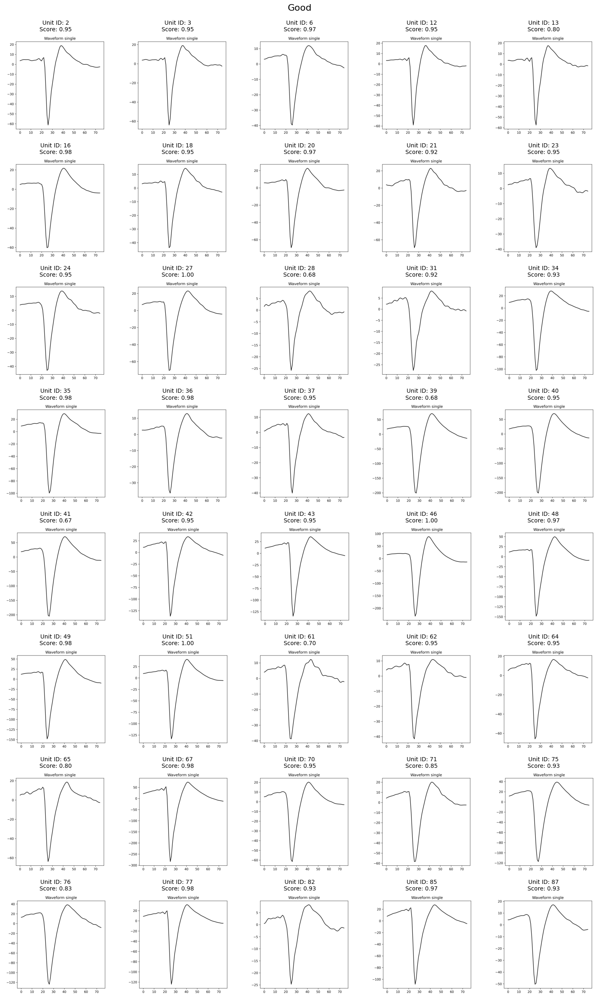

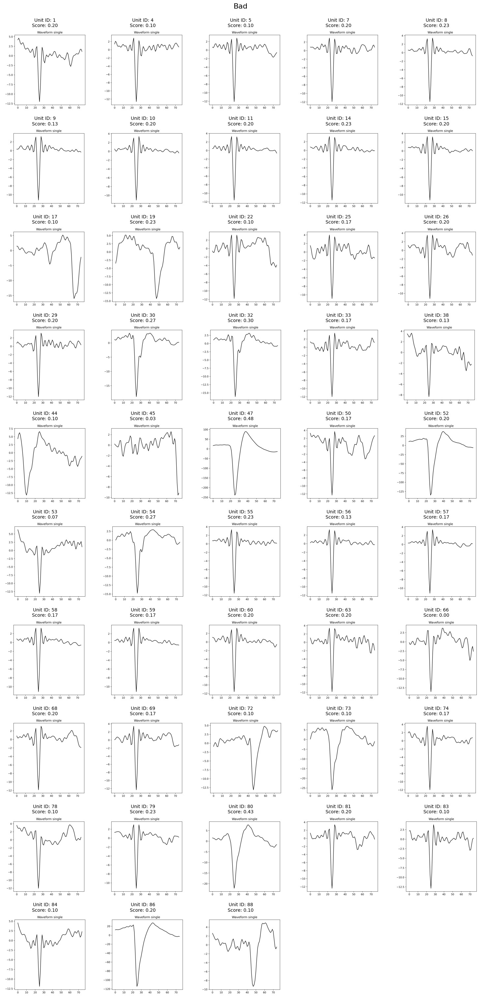

In [16]:
plot_spike_images_with_result(results_df, unit_img_df, feature="waveform_single")

In [23]:
results_df

,average_score,final_classification,combined_reasoning,reviewer_1_score,reviewer_2_score,reviewer_3_score,reviewer_1_class,reviewer_2_class,reviewer_3_class
unit_ids,,,,,,,,,
1,0.20,Bad,"Reviewer 1: The waveform is clearly bad, as it...",0.20,0.20,0.20,Bad,Bad,Bad
2,0.95,Good,Reviewer 1: The waveform is described as havin...,0.95,0.95,0.95,Good,Good,Good
3,0.95,Good,Reviewer 1: The waveform is described as havin...,0.95,0.95,0.95,Good,Good,Good
4,0.10,Bad,"Reviewer 1: The waveform is clearly bad, with ...",0.10,0.10,0.10,Bad,Bad,Bad
5,0.10,Bad,"Reviewer 1: The waveform is clearly bad, as it...",0.10,0.10,0.10,Bad,Bad,Bad
...,...,...,...,...,...,...,...,...,...
84,0.10,Bad,"Reviewer 1: The waveform is clearly bad, with ...",0.10,0.10,0.10,Bad,Bad,Bad
85,0.97,Good,Reviewer 1: The waveform is described as clean...,0.95,1.00,0.95,Good,Good,Good
86,0.20,Bad,Reviewer 1: The waveform is described as clean...,0.20,0.20,0.20,Bad,Bad,Bad


### 4.5 Examine Individual Unit Classifications

Let's look at specific examples to understand the VLM's reasoning. Here we examine a "Bad" unit and a "Good" unit to see SpikeAgent's reasoning.

0.2
Bad
Reviewer 1: The waveform is clearly bad, as it is noisy, lacks a smooth structure, and has an unstable baseline. The spike is isolated to one channel, which is another indicator of poor quality. The autocorrelogram is extremely sparse, almost empty, which suggests a low firing rate or artifacts. Although the spike location shows good isolation, the amplitude stability is poor with sparse and uneven distribution. The SNR is moderate, but the NN hit rate is low, indicating poor distinctiveness. The ISI violations ratio is excellent, but the overall evidence points to a bad unit due to the poor waveform and sparse autocorrelogram.
Reviewer 2: The waveform is clearly bad, as it is noisy, lacks a smooth structure, and shows significant noise and fluctuations in the pre-spike baseline. The spike is isolated to one channel without spatial continuity, which is a negative indicator. The autocorrelogram, while not completely empty, is very sparse, indicating a low firing rate. The spike 

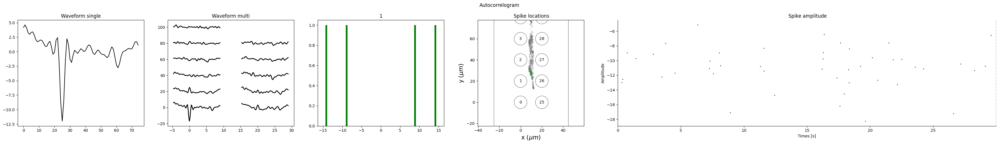

In [ ]:
unit_id = 1 
plot_units_with_features(
    sorting_analyzer,
    unit_ids=[unit_id],
    features=features_to_plot,
    save=False,
)
 # change to your unit ID
print(results_df.loc[unit_id, 'average_score'])
print(results_df.loc[unit_id, 'final_classification'])
print(results_df.loc[unit_id, 'combined_reasoning'])

0.98
Good
Reviewer 1: The waveform is described as having a stable pre-spike baseline, a narrow and steep negative peak, and a smooth return to baseline, all of which are characteristics of a high-quality waveform. The spatial distribution of the waveform across channels is also consistent with a good unit, showing a clear main spike and aligned smaller spikes on adjacent channels. The autocorrelogram shows a clear dip around 0 ms, indicating a valid refractory period, which is a positive sign of a well-isolated neuron. The spike location plot shows a compact and well-defined cluster of spikes, suggesting good isolation. The amplitude stability is consistent over time, with no significant drift or fluctuation, further supporting the quality of the unit. Additionally, the quantitative metrics such as a high SNR, zero ISI violations, a high NN hit rate, and a perfect L-ratio all indicate excellent unit quality. Overall, all modalities support the conclusion that this is a well-isolated s

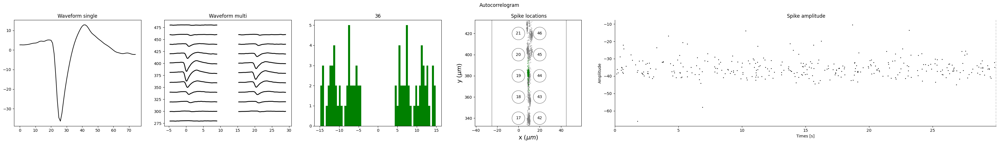

In [32]:
unit_id = 36 
plot_units_with_features(
    sorting_analyzer,
    unit_ids=[unit_id],
    features=features_to_plot,
    save=False,
)
 # change to your unit ID
print(results_df.loc[unit_id, 'average_score'])
print(results_df.loc[unit_id, 'final_classification'])
print(results_df.loc[unit_id, 'combined_reasoning'])

### 4.6 Apply Curation

Now we remove the units classified as "Bad" by the VLM, creating a curated sorting result.

In [33]:
analyzer_curated = sorting_analyzer.remove_units(remove_unit_ids=bad_units)

In [35]:
analyzer_curated 

SortingAnalyzer: 50 channels - 40 units - 1 segments - memory - sparse - has recording
Loaded 12 extensions: random_spikes, waveforms, templates, template_similarity, spike_locations, unit_locations, isi_histograms, correlograms, spike_amplitudes, noise_levels, principal_components, quality_metrics

### 4.7 Evaluate Curation Results

Let's see how the curation improved our results compared to ground truth. The false positive units are significantly reduced.

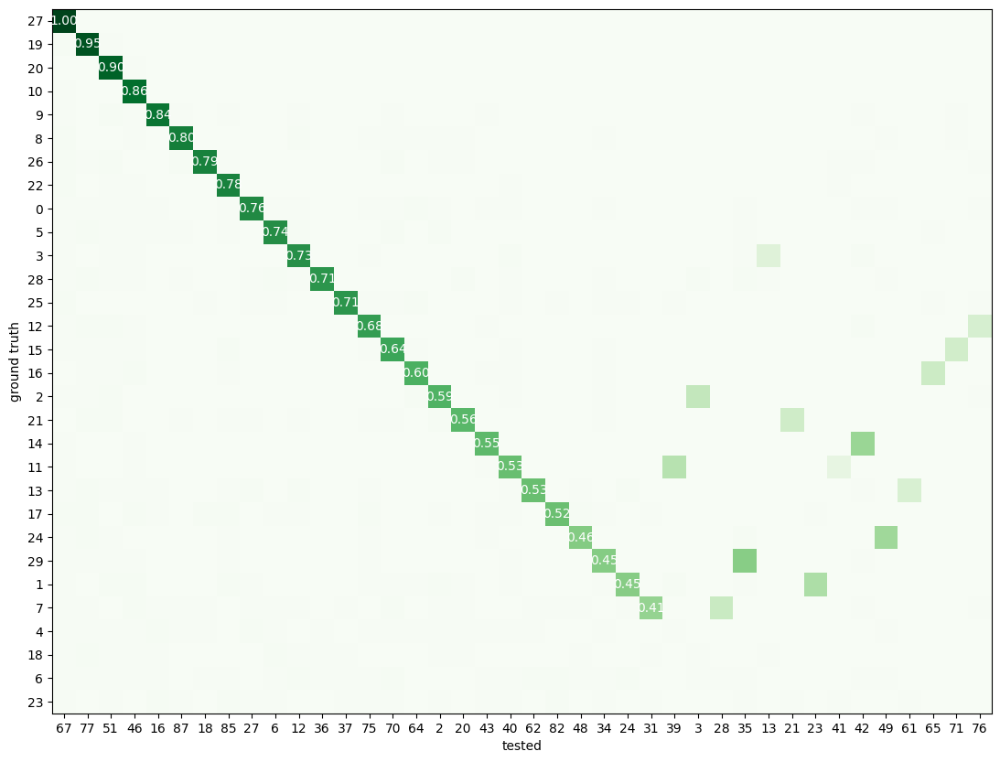

In [36]:
comp_gt_curated = si.compare_sorter_to_ground_truth(gt_sorting=gt_sorting0, tested_sorting=analyzer_curated.sorting, exhaustive_gt=True)
si.plot_agreement_matrix(comp_gt_curated, figsize=(20, 10))

## 5. VLM Merge Analysis: Fixing Oversplit Units

### 5.1 Find Potential Merge Candidates

After curation, we still have oversplit units (single neurons split into multiple units). We use template similarity to identify potential merge candidates.

In [ ]:
from spikeinterface.curation import compute_merge_unit_groups
analyzer_to_merge = analyzer_curated
template_diff_thresh = 0.3 # threshold for template similarity, you can change it to 0.2 
steps = ["template_similarity"]
steps_params = {
    "template_similarity": {"template_diff_thresh": template_diff_thresh}
}
potential_merge_groups_clean = compute_merge_unit_groups(
    analyzer_to_merge,
    resolve_graph=False,
    steps_params=steps_params,
    steps=steps
)
num_groups = len(potential_merge_groups_clean)
print(f"Found {num_groups} potential merge groups.")
if num_groups > 15:
    print("Showing only the first 15 groups:")
for i, group in enumerate(potential_merge_groups_clean[:15]):
    print(f"  Group {i}: {group}")

Found 24 potential merge groups.
Showing only the first 15 groups:
  Group 0: (2, 3)
  Group 1: (12, 13)
  Group 2: (20, 21)
  Group 3: (21, 64)
  Group 4: (23, 24)
  Group 5: (27, 70)
  Group 6: (28, 31)
  Group 7: (34, 35)
  Group 8: (39, 40)
  Group 9: (39, 41)
  Group 10: (40, 41)
  Group 11: (42, 43)
  Group 12: (42, 85)
  Group 13: (43, 85)
  Group 14: (46, 48)


### 5.2 Prepare Merge Images

For each potential merge group, we create images showing cross-correlograms, amplitude distributions, and waveforms. These help the VLM decide if units should be merged.

In [43]:
merge_img_df = create_merge_img_df(analyzer_curated, unit_groups=potential_merge_groups_clean, load_if_exists=False, save_folder=sorting_folder)

100%|██████████| 24/24 [00:21<00:00,  1.12it/s]


Merge images saved to moutainsort4_sorting/merge_img.csv


### 5.3 Run VLM Merge Analysis

The VLM module of SpikeAgent analyzes each potential merge group and decides whether to merge or keep separate based on neurophysiological principles (refractory periods, waveform similarity, etc.).

In [44]:
model = get_model(model_name="gpt-4.1")
merge_results_df = run_vlm_merge(
    model=model,
    merge_unit_groups=potential_merge_groups_clean,
    img_df=merge_img_df,
    features=["crosscorrelograms", "amplitude_plot", "waveform_single"],
    num_workers=50
)

Processing Groups: 100%|██████████| 24/24 [02:46<00:00,  6.95s/unit]


/mnt/Storage7/spikeagent_test/SpikeAgent/src/spikeagent/curation/vlm_merge/process_img.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 1, figsize=(15, 4))


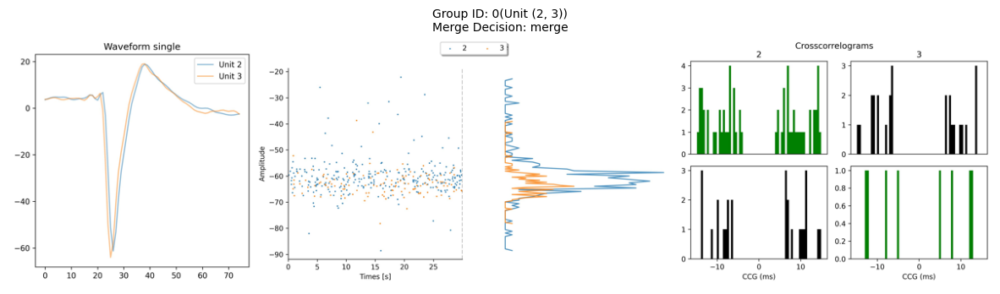

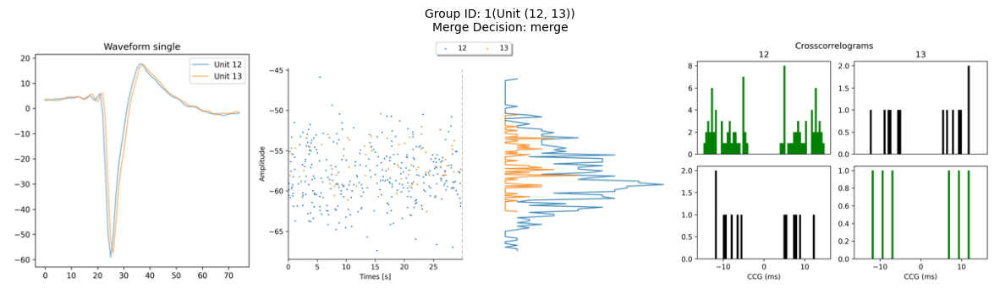

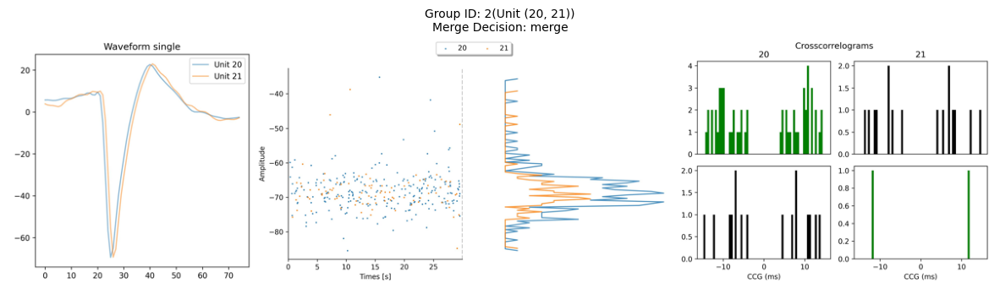

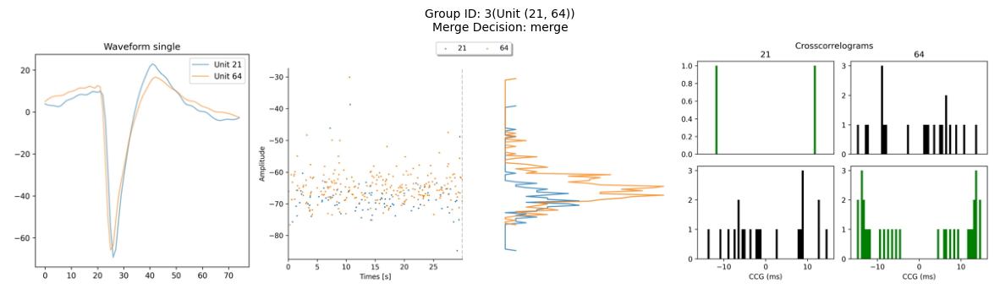

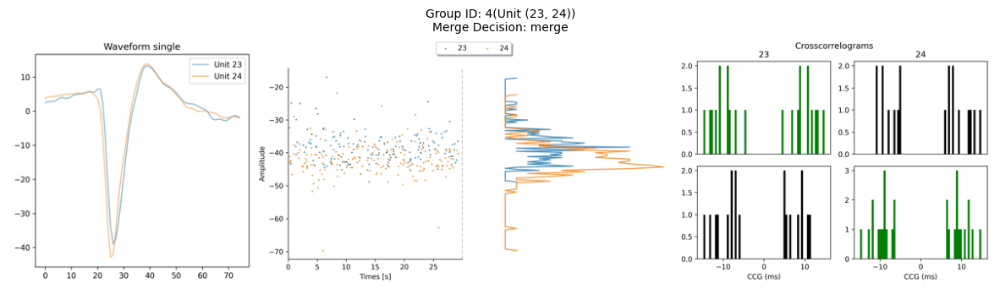

...

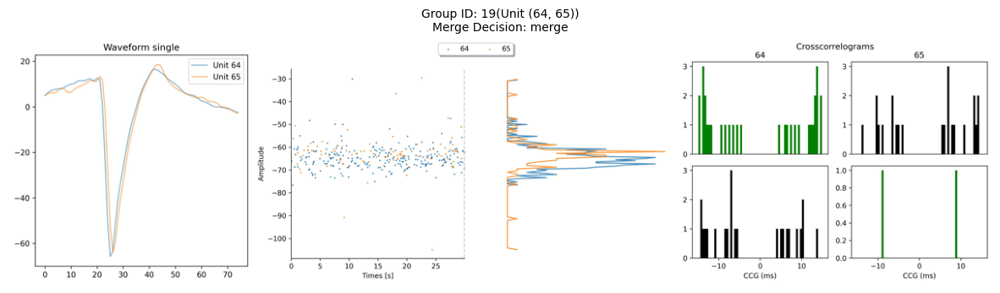

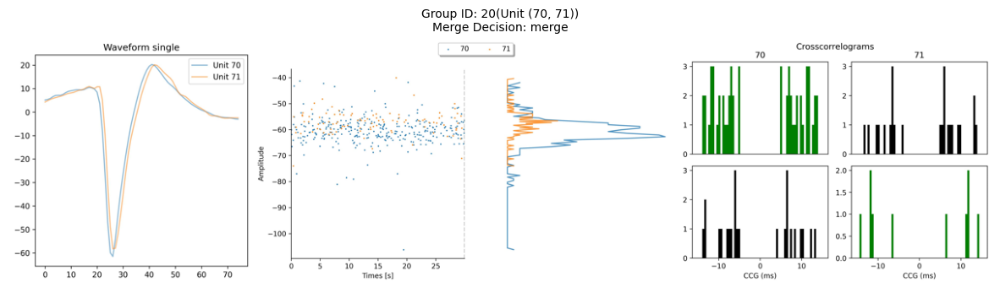

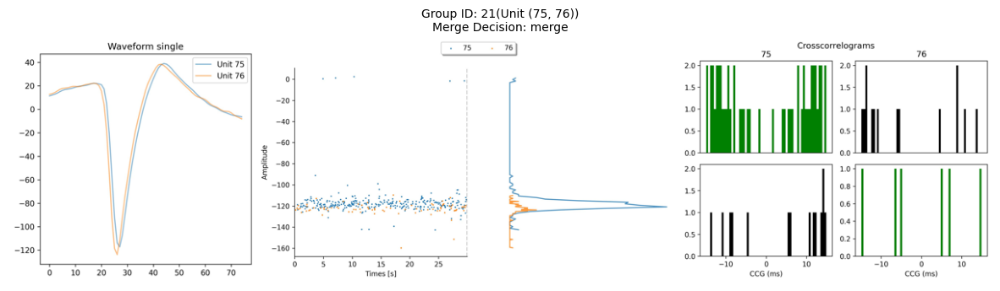

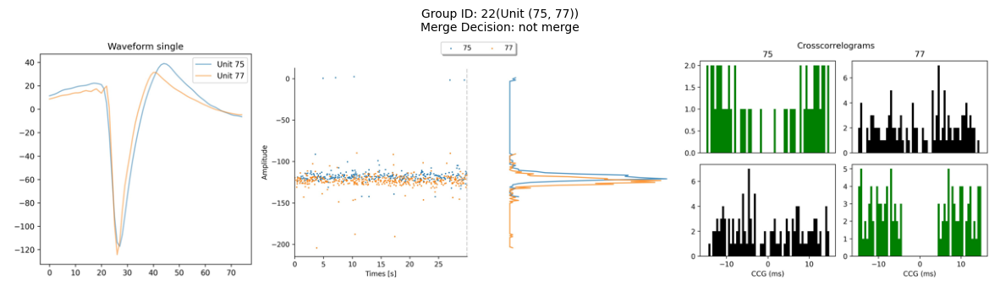

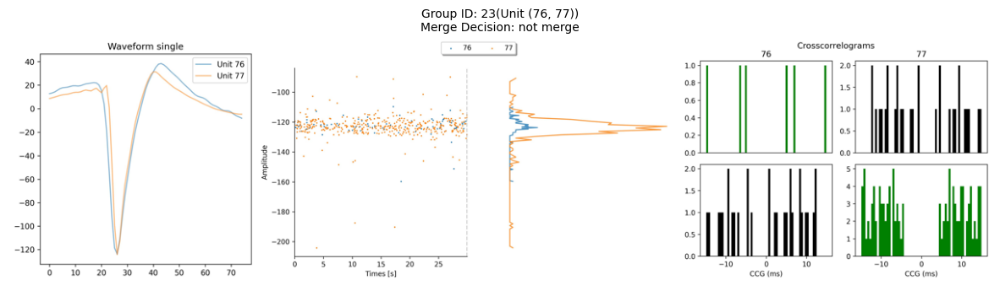

In [45]:
plot_merge_results(merge_results_df, merge_img_df)

### 5.4 Review Merge Decisions

Let's examine the VLM's merge decisions. We can look at specific examples to understand the reasoning behind merge vs. no-merge decisions.

Start with CCG assessment: The cross-correlogram report shows a clear dip in the central ±1.5 ms window, with no spikes in the refractory period, indicating that merging would not violate neurophysiological principles. There is no evidence of a sharp peak at 0 ms (no duplication), and both autocorrelograms show appropriate refractory dips. Next, amplitude report: The amplitude distributions are highly overlapping, with no evidence of separation, further supporting a merge. Finally, waveform report: The waveforms are nearly perfectly superimposed, with identical timing, shape, and kinetics, showing no systematic morphological differences. All three modalities strongly support merging, with no conflicting evidence. Therefore, the final decision is to merge these units.


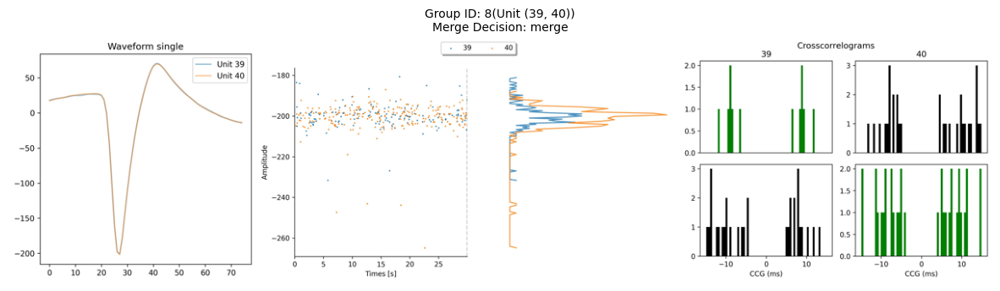

In [46]:
plot_merge_results(merge_results_df[8:9], merge_img_df[8:9])
print(merge_results_df.loc[8, 'reasoning'])

Start with CCG assessment: The cross-correlogram report shows spikes present in the refractory window (±1.5 ms around 0 ms), with no clear dip or depletion at the center. This is an immediate rejection criterion, as it strongly suggests the units are from different neurons. The amplitude report further supports this, showing completely non-overlapping amplitude distributions, which is also an immediate rejection criterion. Although the waveform report finds the waveforms to be highly similar, the presence of refractory violations in the CCG and the non-overlapping amplitude distributions override this. According to the hierarchical strategy, immediate rejection criteria take precedence over waveform similarity. Therefore, the units should not be merged.


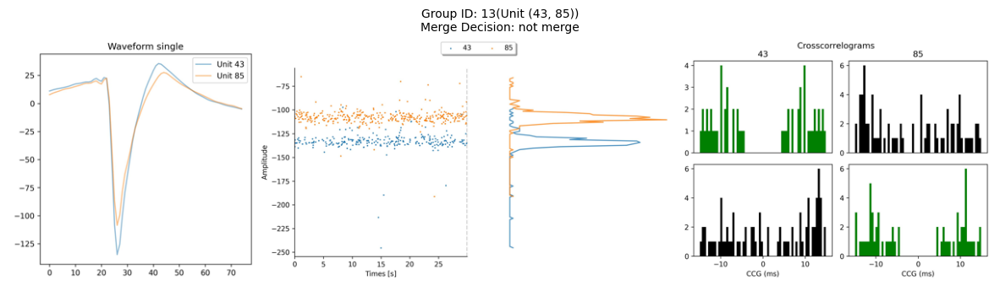

In [47]:
plot_merge_results(merge_results_df[13:14], merge_img_df[13:14])
print(merge_results_df.loc[13, 'reasoning'])

### 5.5 Apply Merges

We resolve the merge graph and apply the recommended merges to create our final, fully curated sorting result.

In [48]:
if merge_results_df is not None:
    merge_groups = merge_results_df[merge_results_df['merge_type'] == 'merge'].index.tolist()
    
    if len(merge_groups) > 0:
        from spikeinterface.curation.curation_tools import resolve_merging_graph
        
        merge_unit_pairs = [merge_results_df.loc[group_idx, 'merge_units'] for group_idx in merge_groups]
        final_merge_groups = resolve_merging_graph(analyzer_curated.sorting, merge_unit_pairs)
        
        print("Applying merges...")
        print(f"Final merge groups: {final_merge_groups}")
        
        if final_merge_groups and len(final_merge_groups) > 0:
            merged_analyzer = analyzer_curated.merge_units(
                merge_unit_groups=final_merge_groups,
                sparsity_overlap=0
            )
            print(f"Created merged_analyzer with {len(merged_analyzer.unit_ids)} units")
            print(f"Original units: {len(analyzer_curated.unit_ids)}")
            print(f"Merged units: {len(merged_analyzer.unit_ids)}")
        else:
            print("No merges to apply after resolving merge graph.")
    else:
        print("No merges recommended. All units should be kept separate.")
else:
    print("No results available - no merge candidates were found.")

Applying merges...
Final merge groups: [[2, 3], [12, 13], [20, 21, 64, 65], [23, 24], [28, 31], [34, 35], [39, 40, 41], [42, 43], [48, 49], [61, 62], [70, 71], [75, 76]]


/home/arnau/miniconda3/envs/spikeagent_test/lib/python3.11/site-packages/spikeinterface/qualitymetrics/misc_metrics.py:311: UserWarning: Bin duration of 60s is larger than recording duration. Presence ratios are set to NaN.
  warnings.warn(
/home/arnau/miniconda3/envs/spikeagent_test/lib/python3.11/site-packages/spikeinterface/qualitymetrics/misc_metrics.py:1059: UserWarning: Some units have too few spikes : amplitude_cutoff is set to NaN
  warnings.warn(f"Some units have too few spikes : amplitude_cutoff is set to NaN")


calculate_pc_metrics:   0%|          | 0/12 [00:00<?, ?it/s]

/home/arnau/miniconda3/envs/spikeagent_test/lib/python3.11/site-packages/sklearn/utils/parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
/home/arnau/miniconda3/envs/spikeagent_test/lib/python3.11/site-packages/sklearn/utils/parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
/home/arnau/miniconda3/envs/spikeagent_test/lib/python3.11/site-packages/sklearn/utils/parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
/home/arna

Created merged_analyzer with 25 units
Original units: 40
Merged units: 25


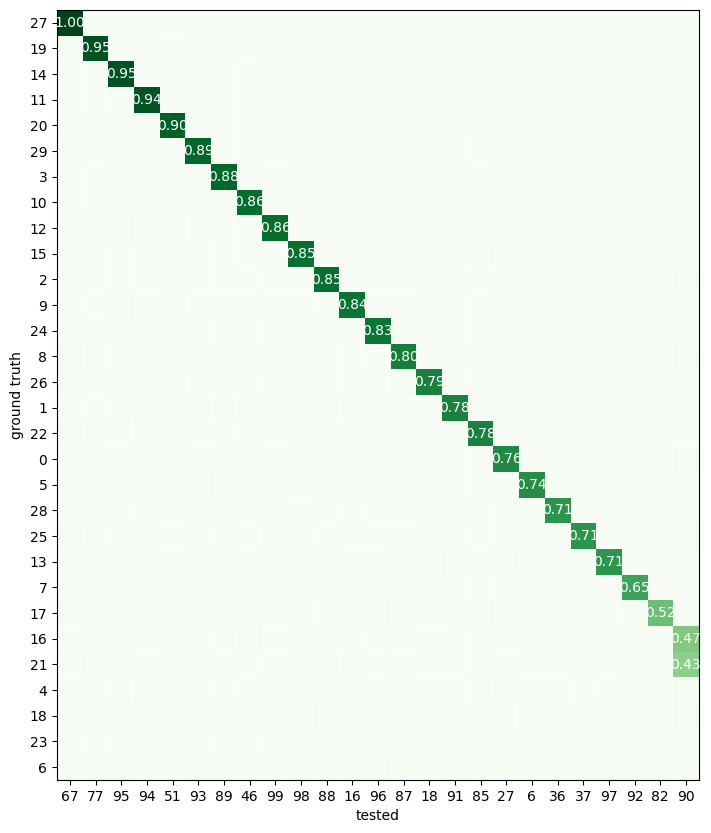

In [49]:
comp_gt_with_merged_analyzer= si.compare_sorter_to_ground_truth(gt_sorting=gt_sorting0, tested_sorting=merged_analyzer.sorting)
si.plot_agreement_matrix(comp_gt_with_merged_analyzer, figsize=(16, 10))

# We can see that after VLM merging, the curation results match the ground truth significantly better

## 6. Final Results: Complete VLM Workflow

### 6.1 Compare All Stages

Let's compare the performance at each stage: original sorting, after curation, and after merging.

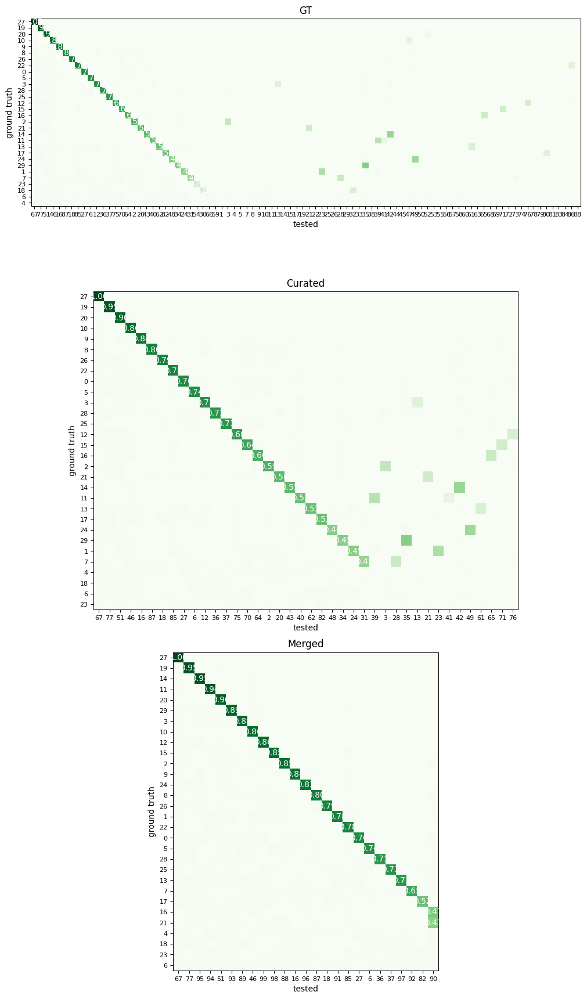

In [56]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(
    nrows=3, ncols=1,
    figsize=(10, 18),
    constrained_layout=True,
    sharex=False,  # set True if you want identical x limits
    sharey=False   # set True if you want identical y limits
)

plots = [
    ("GT", comp_gt),
    ("Curated", comp_gt_curated),
    ("Merged", comp_gt_with_merged_analyzer),
]

for ax, (title, comp) in zip(axes, plots):
    si.plot_agreement_matrix(comp, ax=ax)
    ax.set_title(title)

    # keep matrix square and prevent weird stretching
    ax.set_aspect("equal", adjustable="box")

    # optional: make tick labels consistent
    ax.tick_params(axis="both", labelsize=8)

plt.show()

### 6.2 Summary

This tutorial demonstrated the complete VLM-assisted curation workflow:

1. **VLM Curation** significantly reduced false positive units by identifying noisy, poorly isolated units
2. **VLM Merge Analysis** fixed oversplit units by merging units that belong to the same neuron
3. **Combined workflow** improved both precision (fewer false positives) and recall (fewer missed neurons)

The VLM approach provides interpretable, automated curation that combines visual analysis with quantitative metrics, making spike sorting results more reliable and reducing manual curation time.